In [1]:
import pandas as pd


train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')



print(train_data.head())


   Unnamed: 0          x          y  cls
0           0  -0.421121   0.989526    0
1           1  -2.313032   6.122276    0
2           2   1.831469   0.518892    1
3           3   1.135357   7.467182    0
4           4  16.431691  16.777048    1


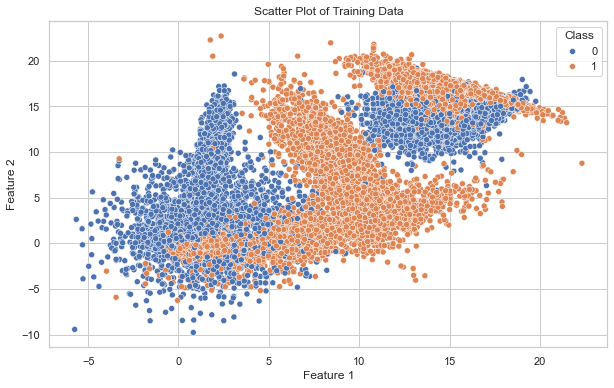

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns


sns.set(style='whitegrid')


plt.figure(figsize=(10, 6))
sns.scatterplot(data=train_data, x='x', y='y', hue='cls', palette='deep')


plt.title('Scatter Plot of Training Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(title='Class')
plt.show()


In [9]:

X_train = train_data[['x', 'y']].values
y_train = train_data['cls'].values

X_test = test_data[['x', 'y']].values
y_test = test_data['cls'].values


Bagging

In [6]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import GridSearchCV


param_grid = {
    'max_depth': [1, 2, 3, 4, 5],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}


dt = DecisionTreeClassifier()


grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
print("Best Parameters from GridSearchCV:", best_params)


Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Parameters from GridSearchCV: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [30]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
def evaluate_model(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    metrics = {
        'Accuracy': [accuracy_score(y_train, y_pred_train), accuracy_score(y_test, y_pred_test)],
        'Precision': [precision_score(y_train, y_pred_train), precision_score(y_test, y_pred_test)],
        'Recall': [recall_score(y_train, y_pred_train), recall_score(y_test, y_pred_test)],
        'F1-Score': [f1_score(y_train, y_pred_train), f1_score(y_test, y_pred_test)]
    }
    return pd.DataFrame(metrics, index=['Train', 'Test'])

def plot_accuracy_single_model(model, X_train, X_test, y_train, y_test):
 
    estimators = range(1, 51)
    accuracy_scores = []
    best_accuracy = 0
    best_n = 1

    for n in estimators:
        model.n_estimators = n
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_n = n

    plt.plot(estimators, accuracy_scores, label='Model Accuracy')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Number of Estimators')
    plt.show()

    return best_n

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Parameters from GridSearchCV: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}


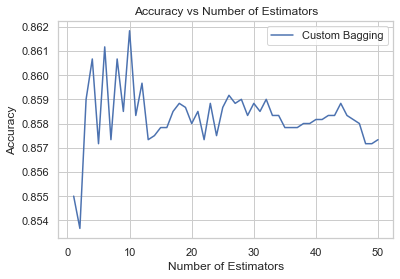

Best number of estimators: 10


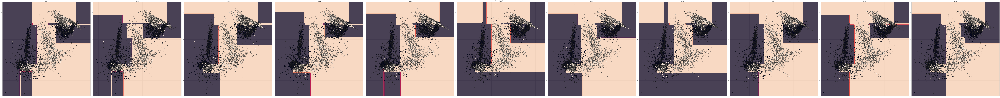

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

X_train = train_data[['x', 'y']].values
y_train = train_data['cls'].values

X_test = test_data[['x', 'y']].values
y_test = test_data['cls'].values

class CustomBaggingClassifier:
    def __init__(self, base_estimator, n_estimators=10, random_state=None):
        self.base_estimator = base_estimator
        self.n_estimators = n_estimators
        self.models = []
        self.random_state = random_state
        if random_state is not None:
            np.random.seed(random_state)
    
    def _bootstrap_sample(self, X, y):
        """Create a bootstrap sample from the dataset."""
        n_samples = X.shape[0]
        indices = np.random.choice(range(n_samples), size=n_samples, replace=True)
        return X[indices], y[indices]
    
    def fit(self, X, y):
        """Train the ensemble of models."""
        self.models = []
        for _ in range(self.n_estimators):
            X_sample, y_sample = self._bootstrap_sample(X, y)
            model = DecisionTreeClassifier(**best_params)
            model.fit(X_sample, y_sample)
            self.models.append(model)
    
    def predict(self, X):
        """Aggregate predictions from all models."""
        predictions = np.array([model.predict(X) for model in self.models])
        majority_vote = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=predictions)
        return majority_vote


from sklearn.model_selection import GridSearchCV
param_grid = {
    'max_depth': [1, 2, 3, 4, 5],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}
dt = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print("Best Parameters from GridSearchCV:", best_params)


def find_best_n_estimators(X_train, y_train, X_test, y_test):
    estimators_range = range(1, 51)
    accuracies = []
    for n_estimators in estimators_range:
        bagging_clf = CustomBaggingClassifier(base_estimator=DecisionTreeClassifier(**best_params), 
                                              n_estimators=n_estimators, random_state=42)
        bagging_clf.fit(X_train, y_train)
        y_pred = bagging_clf.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        accuracies.append(acc)
    plt.plot(estimators_range, accuracies, label="Custom Bagging")
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Number of Estimators')
    plt.legend()
    plt.show()
    best_n = estimators_range[np.argmax(accuracies)]
    return best_n, accuracies

best_n, accuracies = find_best_n_estimators(X_train, y_train, X_test, y_test)
print("Best number of estimators:", best_n)


final_bagging_clf = CustomBaggingClassifier(base_estimator=DecisionTreeClassifier(**best_params), 
                                            n_estimators=best_n, random_state=42)
final_bagging_clf.fit(X_train, y_train)

# Visualize decision boundaries
def plot_decision_boundaries(models, X, y, title=""):
    
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    fig, axes = plt.subplots(1, len(models) + 1, figsize=(200, 20))
    for idx, model in enumerate(models):
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        axes[idx].contourf(xx, yy, Z, alpha=0.8)
        axes[idx].scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', s=20)
        axes[idx].set_title(f"Model {idx + 1}")
    
    # Plot final ensemble
    Z_ensemble = final_bagging_clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_ensemble = Z_ensemble.reshape(xx.shape)
    axes[-1].contourf(xx, yy, Z_ensemble, alpha=0.8)
    axes[-1].scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', s=20)
    axes[-1].set_title("Ensemble")
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


plot_decision_boundaries(final_bagging_clf.models, X_train, y_train, "Decision Boundaries")


Training Metrics:
  Accuracy:  0.8626
  Precision: 0.8657
  Recall:    0.8587
  F1-Score:  0.8622

Testing Metrics:
  Accuracy:  0.8618
  Precision: 0.8627
  Recall:    0.8590
  F1-Score:  0.8608



C:\Users\ASUS\AppData\Local\Temp\ipykernel_13580\2938913425.py:63: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(contour, ax=ax)


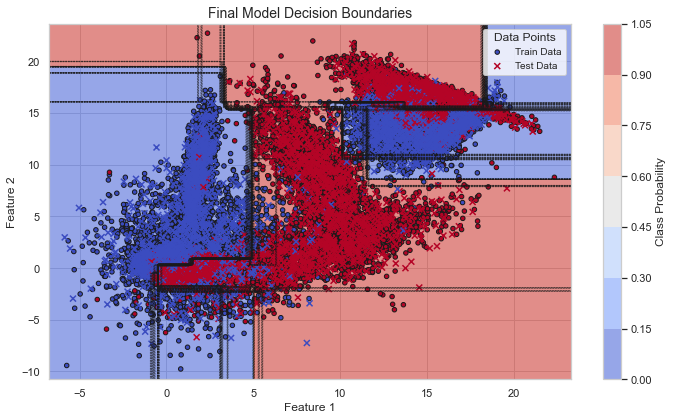

In [ ]:
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score

def evaluate_and_plot(ensemble_model, X_train, y_train, X_test, y_test, title="Final Model Decision Boundaries"):
    

    y_train_pred = ensemble_model.predict(X_train)
    y_test_pred = ensemble_model.predict(X_test)
    

    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)
    

    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    

    print("Training Metrics:")
    print(f"  Accuracy:  {train_accuracy:.4f}")
    print(f"  Precision: {train_precision:.4f}")
    print(f"  Recall:    {train_recall:.4f}")
    print(f"  F1-Score:  {train_f1:.4f}\n")
    
    print("Testing Metrics:")
    print(f"  Accuracy:  {test_accuracy:.4f}")
    print(f"  Precision: {test_precision:.4f}")
    print(f"  Recall:    {test_recall:.4f}")
    print(f"  F1-Score:  {test_f1:.4f}\n")
    

    sns.set(style="whitegrid")
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    
    fig, ax = plt.subplots(figsize=(10, 6))


    Z = ensemble_model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    contour = ax.contourf(xx, yy, Z, alpha=0.6, cmap='coolwarm')

    for idx, model in enumerate(ensemble_model.models):
        Z_base = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z_base = Z_base.reshape(xx.shape)
        ax.contour(xx, yy, Z_base, alpha=0.5, linewidths=0.5, linestyles='--', colors='k')

    scatter = ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', s=20, cmap='coolwarm', label="Train Data")
    scatter_test = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker='x', cmap='coolwarm', label="Test Data")
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")
    

    cbar = fig.colorbar(contour, ax=ax)
    cbar.set_label('Class Probability')
    ax.legend(loc="upper right", fontsize=10, title="Data Points")
    plt.tight_layout()
    plt.show()


evaluate_and_plot(final_bagging_clf, X_train, y_train, X_test, y_test)


Bagging Library

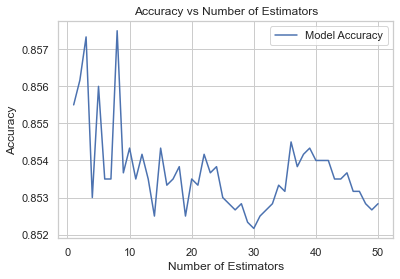

Bagging_library
best n_estimator: 8
       Accuracy  Precision    Recall  F1-Score
Train  0.860083   0.858124  0.863266  0.860687
Test   0.857500   0.853117  0.861977  0.857524


In [37]:

best_n_estimator = plot_accuracy_single_model(BaggingClassifier(estimator=grid_search.best_estimator_, random_state=42), X_train, X_test, y_train, y_test)
print("Bagging_library")
print(f"best n_estimator: {best_n_estimator}")
bagging_lib = BaggingClassifier(estimator=grid_search.best_estimator_, n_estimators=best_n_estimator, random_state=42)
bagging_lib.fit(X_train, y_train)
print(evaluate_model(bagging_lib, X_train, y_train, X_test, y_test))



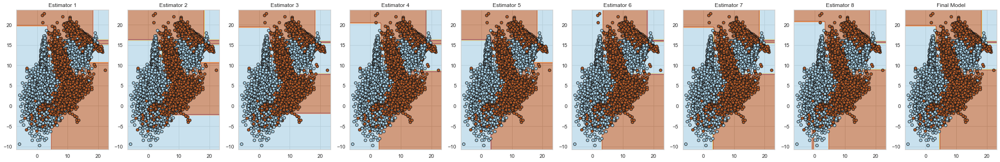

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import DecisionBoundaryDisplay


def plot_decision_boundary(estimator, X, y, ax, title):
    DecisionBoundaryDisplay.from_estimator(
        estimator,
        X,
        response_method="predict",
        ax=ax,
        cmap=plt.cm.Paired,
        alpha=0.6
    )
    ax.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', cmap=plt.cm.Paired)
    ax.set_title(title)


def plot_estimators_classification(bagging_model, X, y):
    n_estimators = len(bagging_model.estimators_)
    fig, axes = plt.subplots(1, n_estimators + 1, figsize=(30, 5))
    

    for idx, estimator in enumerate(bagging_model.estimators_):
        plot_decision_boundary(estimator, X, y, axes[idx], f"Estimator {idx + 1}")
    

    plot_decision_boundary(bagging_model, X, y, axes[-1], "Final Model")
    plt.tight_layout()
    plt.show()

plot_estimators_classification(bagging_lib, X_train, y_train)


In [43]:
def find_best_n_estimators(X_train, y_train, X_test, y_test, param_grid, max_features="sqrt", random_state=42):
    results = []
    for n in range(1, 51):  # Test n_estimators from 1 to 50
        custom_rf = CustomRandomForestClassifier(
            n_estimators=n,
            param_grid=param_grid,
            max_features=max_features,
            random_state=random_state
        )
        custom_rf.fit(X_train, y_train)
        y_pred = custom_rf.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results.append((n, accuracy))
    
    # Find the best n_estimators
    results = np.array(results)
    best_n_estimators = results[np.argmax(results[:, 1]), 0]
    
    # Plot results
    plt.figure(figsize=(10, 6))
    plt.plot(results[:, 0], results[:, 1], marker='o', linestyle='-', color='b')
    plt.xlabel('Number of Estimators (n_estimators)')
    plt.ylabel('Accuracy on Test Set')
    plt.title('Accuracy vs Number of Estimators')
    plt.grid(True)
    plt.show()
    
    print(f"Best n_estimators: {int(best_n_estimators)} with Accuracy: {np.max(results[:, 1]):.4f}")
    return int(best_n_estimators)

Random Forest


       Accuracy  Precision    Recall  F1-Score
Train  0.835042   0.805120  0.884654  0.843015
Test   0.829167   0.799145  0.877052  0.836288
Best n_estimators: 22


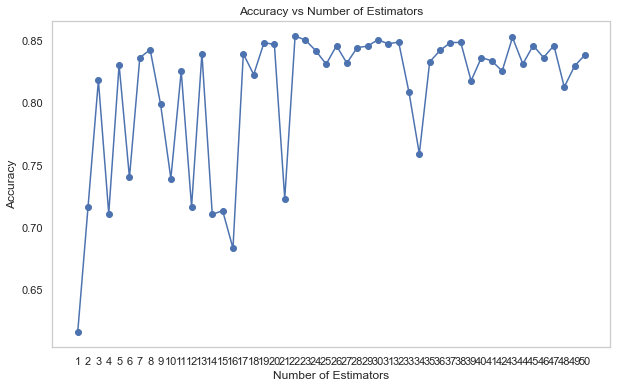

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils import resample
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

class CustomRandomForestClassifier:
    def __init__(self, n_estimators=100, param_grid=None, max_features="sqrt", random_state=None):
        self.n_estimators = n_estimators
        self.param_grid = param_grid
        self.max_features = max_features
        self.random_state = random_state
        self.trees = []
        
        if random_state is not None:
            np.random.seed(random_state)

    def _get_params(self):
        """Randomly select parameters for each tree from the parameter grid."""
        params = {}
        for param, values in self.param_grid.items():
            params[param] = np.random.choice(values)
        return params
    
    def fit(self, X, y):
        """Fit the model to the data."""
        for _ in range(self.n_estimators):

            X_sample, y_sample = resample(X, y, random_state=self.random_state)

            params = self._get_params()

            tree = DecisionTreeClassifier(
                max_depth=params['max_depth'],
                min_samples_split=params['min_samples_split'],
                min_samples_leaf=params['min_samples_leaf'],
                max_features=self.max_features,
                random_state=self.random_state
            )
            tree.fit(X_sample, y_sample)
            self.trees.append(tree)

    def predict(self, X):
        """Aggregate predictions from all trees."""
        tree_preds = np.array([tree.predict(X) for tree in self.trees])

        return np.array([np.bincount(tree_pred).argmax() for tree_pred in tree_preds.T])

def find_best_n_estimators(X_train, y_train, X_test, y_test, param_grid):

    best_n_estimators = 0
    best_accuracy = 0
    accuracies = []

    for n in range(1, 51): 
        model = CustomRandomForestClassifier(n_estimators=n, param_grid=param_grid)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        
        accuracies.append(accuracy)
        
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_n_estimators = n
            
    return best_n_estimators, accuracies

def evaluate_model(model, X_train, y_train, X_test, y_test):

    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    metrics = {
        'Accuracy': [accuracy_score(y_train, y_pred_train), accuracy_score(y_test, y_pred_test)],
        'Precision': [precision_score(y_train, y_pred_train), precision_score(y_test, y_pred_test)],
        'Recall': [recall_score(y_train, y_pred_train), recall_score(y_test, y_pred_test)],
        'F1-Score': [f1_score(y_train, y_pred_train), f1_score(y_test, y_pred_test)]
    }
    
    return pd.DataFrame(metrics, index=['Train', 'Test'])

def plot_accuracies(accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 51), accuracies, marker='o')
    plt.title('Accuracy vs Number of Estimators')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy')
    plt.xticks(range(1, 51))
    plt.grid()
    plt.show()


param_grid = {
    'max_depth': [1, 2, 3, 4, 5],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}


best_n_estimators, accuracies = find_best_n_estimators(X_train, y_train, X_test, y_test, param_grid)


custom_rf_final = CustomRandomForestClassifier(
    n_estimators=best_n_estimators,
    param_grid=param_grid,
    max_features="sqrt",
    random_state=42
)
custom_rf_final.fit(X_train, y_train)

evaluation_results_final = evaluate_model(custom_rf_final, X_train, y_train, X_test, y_test)
print(evaluation_results_final)
print(f"Best n_estimators: {best_n_estimators}")

plot_accuracies(accuracies)



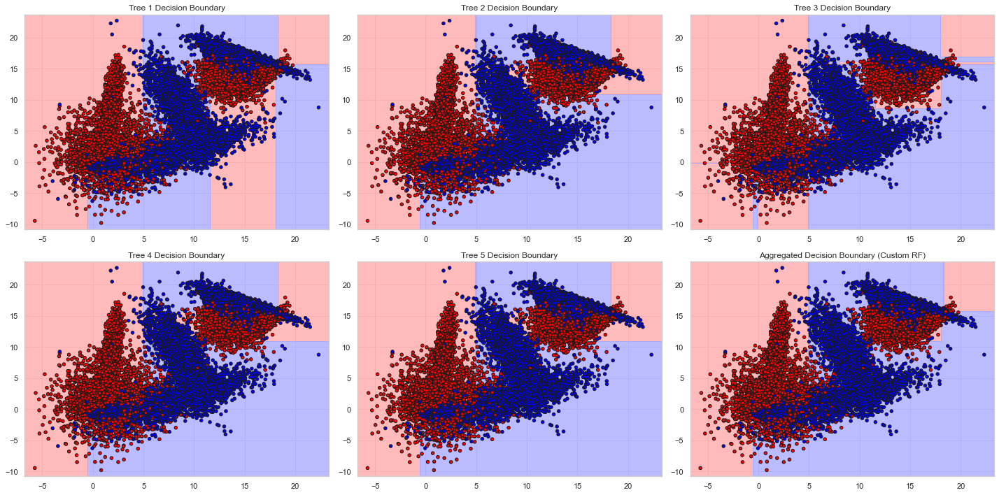

In [58]:
from matplotlib.colors import ListedColormap


cmap_background = ListedColormap(["#FFAAAA", "#AAAAFF"])
cmap_points = ListedColormap(["#FF0000", "#0000FF"])

plt.figure(figsize=(20, 10))

for i, tree in enumerate(custom_rf_final.trees[:5], start=1):
    plt.subplot(2, 3, i)
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = tree.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=cmap_background)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap_points, edgecolor="k", s=20)
    plt.title(f"Tree {i} Decision Boundary")

plt.subplot(2, 3, 6)
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))
Z = custom_rf_final.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.8, cmap=cmap_background)
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap_points, edgecolor="k", s=20)
plt.title("Aggregated Decision Boundary (Custom RF)")

plt.tight_layout()
plt.show()


Random Forest Library

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Parameters from Grid Search (excluding n_estimators): {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5}
       Accuracy  Precision    Recall  F1-Score
Train  0.864375   0.850973  0.883905  0.867127
Test   0.858833   0.844173  0.878392  0.860942
Best n_estimators: 42


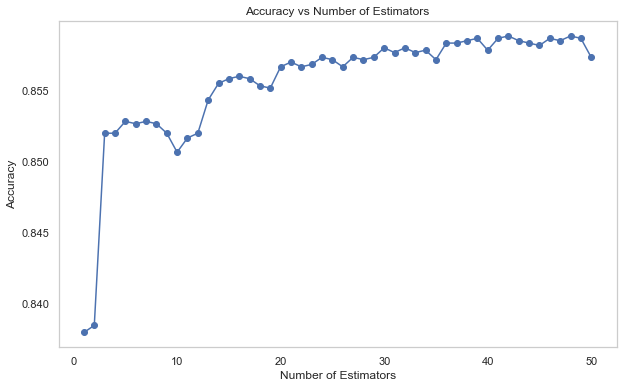

In [59]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import matplotlib.pyplot as plt

def grid_search_fixed_params(X_train, y_train, param_grid):

    rf = RandomForestClassifier(random_state=42, n_estimators=10)  # Use a placeholder n_estimators value
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                               scoring='accuracy', cv=5, n_jobs=-1, verbose=1)
    grid_search.fit(X_train, y_train)

    return grid_search.best_params_

def find_best_n_estimators_with_grid_params(X_train, y_train, X_test, y_test, best_params):

    best_n_estimators = 0
    best_accuracy = 0
    accuracies = []

    for n in range(1, 51):
        model = RandomForestClassifier(n_estimators=n, **best_params, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)

        accuracies.append(accuracy)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_n_estimators = n

    return best_n_estimators, accuracies

def evaluate_model_sklearn(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    metrics = {
        'Accuracy': [accuracy_score(y_train, y_pred_train), accuracy_score(y_test, y_pred_test)],
        'Precision': [precision_score(y_train, y_pred_train), precision_score(y_test, y_pred_test)],
        'Recall': [recall_score(y_train, y_pred_train), recall_score(y_test, y_pred_test)],
        'F1-Score': [f1_score(y_train, y_pred_train), f1_score(y_test, y_pred_test)]
    }
    
    return pd.DataFrame(metrics, index=['Train', 'Test'])

def plot_accuracies(accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 51), accuracies, marker='o')
    plt.title('Accuracy vs Number of Estimators')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy')
    plt.grid()
    plt.show()

param_grid = {
    'max_depth': [1, 2, 3, 4, 5],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}

best_params = grid_search_fied_params(X_train, y_train, param_grid)
print("Best Parameters from Grid Search (excluding n_estimators):", best_params)

best_n_estimators, accuracies = find_best_n_estimators_with_grid_params(X_train, y_train, X_test, y_test, best_params)

final_model = RandomForestClassifier(n_estimators=best_n_estimators, **best_params, random_state=42)
final_model.fit(X_train, y_train)

evaluation_results_final = evaluate_model_sklearn(final_model, X_train, y_train, X_test, y_test)
print(evaluation_results_final)
print(f"Best n_estimators: {best_n_estimators}")

plot_accuracies(accuracies)


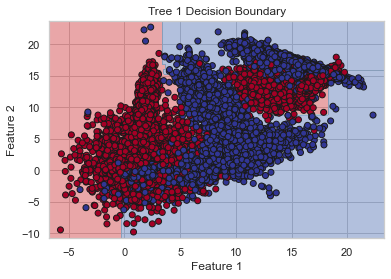

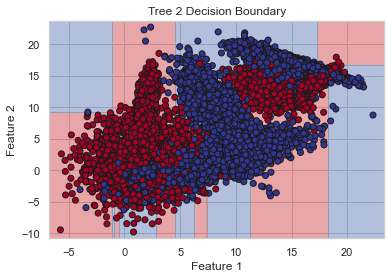

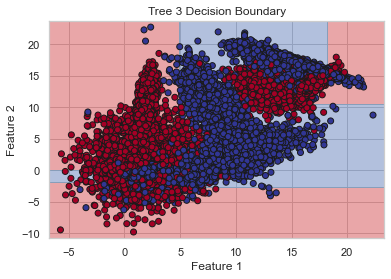

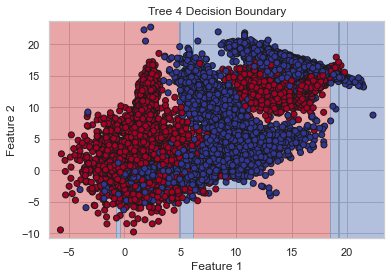

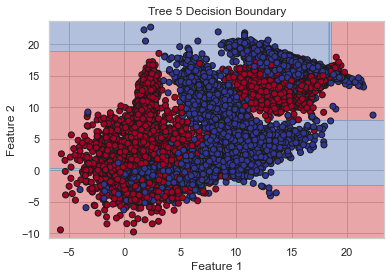

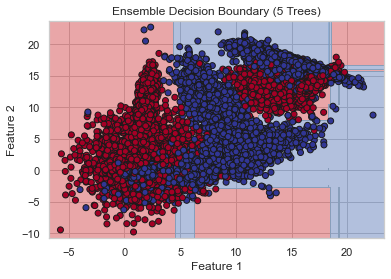

Accuracy on Train Set: 0.8597916666666666
Accuracy on Test Set: 0.8528333333333333


In [60]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

def plot_decision_boundary(clf, X, y, title="Decision Boundary"):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.4, cmap=plt.cm.RdYlBu)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', cmap=plt.cm.RdYlBu)
    plt.title(title)
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()

def visualize_individual_trees_and_ensemble(X_train, y_train, X_test, y_test, best_params):
    model = RandomForestClassifier(n_estimators=5, **best_params, random_state=42)
    model.fit(X_train, y_train)
    
 
    for i, tree in enumerate(model.estimators_):
        plot_decision_boundary(tree, X_train, y_train, title=f"Tree {i+1} Decision Boundary")
    

    plot_decision_boundary(model, X_train, y_train, title="Ensemble Decision Boundary (5 Trees)")

    print("Accuracy on Train Set:", model.score(X_train, y_train))
    print("Accuracy on Test Set:", model.score(X_test, y_test))


visualize_individual_trees_and_ensemble(X_train, y_train, X_test, y_test, best_params)


Adaboost

In [63]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_model(model, X_train, y_train, X_test, y_test):

    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    

    metrics = {
        'Accuracy': [
            accuracy_score(y_train, y_pred_train),
            accuracy_score(y_test, y_pred_test)
        ],
        'Precision': [
            precision_score(y_train, y_pred_train, average='weighted'),
            precision_score(y_test, y_pred_test, average='weighted')
        ],
        'Recall': [
            recall_score(y_train, y_pred_train, average='weighted'),
            recall_score(y_test, y_pred_test, average='weighted')
        ],
        'F1-Score': [
            f1_score(y_train, y_pred_train, average='weighted'),
            f1_score(y_test, y_pred_test, average='weighted')
        ]
    }

    return pd.DataFrame(metrics, index=['Train', 'Test'])


C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the S

Best number of estimators: 42
Best test accuracy: 0.85


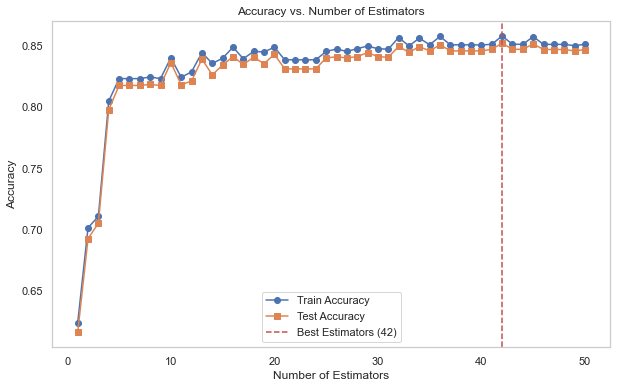

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score


weak_classifier = DecisionTreeClassifier(max_depth=1)


train_accuracies = []
test_accuracies = []

n_estimators_range = range(1, 51)

for n_estimators in n_estimators_range:
    ada_model = AdaBoostClassifier(estimator=weak_classifier, n_estimators=n_estimators, random_state=42)
    ada_model.fit(X_train, y_train)
    

    y_pred_train = ada_model.predict(X_train)
    y_pred_test = ada_model.predict(X_test)
    

    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

best_n_estimators = n_estimators_range[np.argmax(test_accuracies)]
best_accuracy = max(test_accuracies)

print(f"Best number of estimators: {best_n_estimators}")
print(f"Best test accuracy: {best_accuracy:.2f}")


plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(n_estimators_range, test_accuracies, label='Test Accuracy', marker='s')
plt.axvline(best_n_estimators, color='r', linestyle='--', label=f'Best Estimators ({best_n_estimators})')

plt.title('Accuracy vs. Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()


In [65]:
ada_model = AdaBoostClassifier(estimator=weak_classifier, n_estimators=best_n_estimators, random_state=42)
ada_model.fit(X_train, y_train)
metrics_df = evaluate_model(ada_model, X_train, y_train, X_test, y_test)
print(metrics_df)

C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


       Accuracy  Precision    Recall  F1-Score
Train  0.858042   0.858115  0.858042  0.858036
Test   0.852167   0.852206  0.852167  0.852157


C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the S

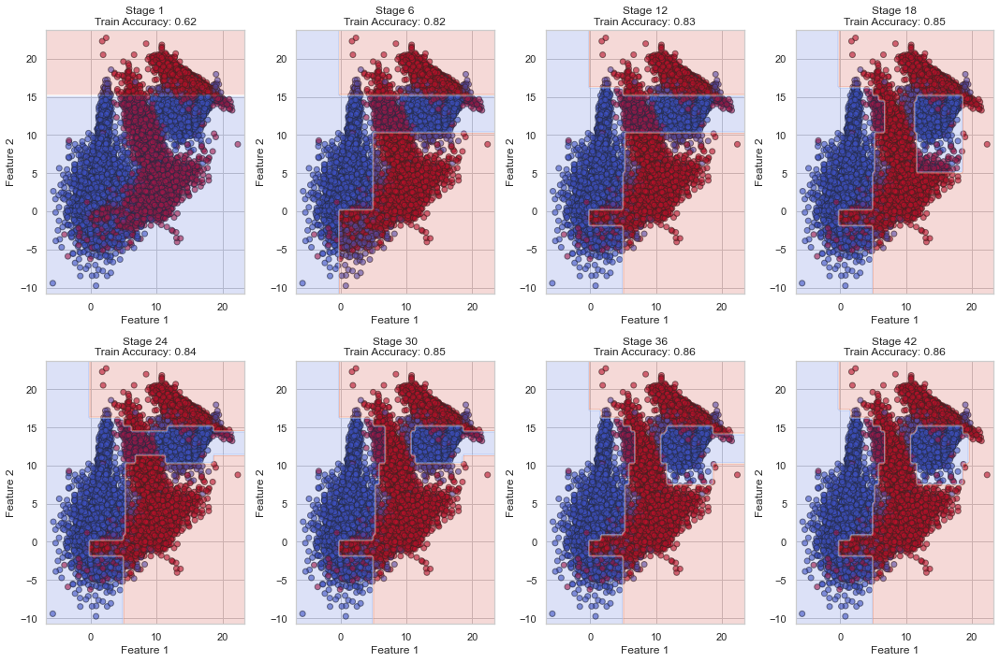

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


stages = np.linspace(1, best_n_estimators, 8, dtype=int)

plt.figure(figsize=(15, 10))
for i, stage in enumerate(stages, 1):

    partial_model = AdaBoostClassifier(estimator=weak_classifier, n_estimators=stage, random_state=42)
    partial_model.fit(X_train, y_train)
    

    y_pred_train = partial_model.predict(X_train)
    accuracy = accuracy_score(y_train, y_pred_train)
    

    plt.subplot(2, 4, i)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='coolwarm', edgecolor='k', alpha=0.6, label='True Labels')
    

    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = partial_model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    

    plt.contourf(xx, yy, Z, alpha=0.2, cmap='coolwarm')
    plt.title(f"Stage {stage}\nTrain Accuracy: {accuracy:.2f}")
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()


Stacked Learner

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

X_train = train_data[['x', 'y']].values
y_train = train_data['cls'].values

X_test = test_data[['x', 'y']].values
y_test = test_data['cls'].values

base_models = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
    ('svc', SVC(probability=True, random_state=42)),
    ('mlp', MLPClassifier(max_iter=500, random_state=42))
]


kf = KFold(n_splits=5, shuffle=True, random_state=42)
meta_features = np.zeros((X_train.shape[0], len(base_models)))
test_meta_features = np.zeros((X_test.shape[0], len(base_models)))

for i, (name, model) in enumerate(base_models):
    test_fold_predictions = []
    train_accuracies = []
    val_accuracies = []
    for train_idx, val_idx in kf.split(X_train):
        X_train_fold, X_val_fold = X_train[train_idx], X_train[val_idx]
        y_train_fold, y_val_fold = y_train[train_idx], y_train[val_idx]

        model.fit(X_train_fold, y_train_fold)
        train_accuracy = model.score(X_train_fold, y_train_fold)
        val_accuracy = model.score(X_val_fold, y_val_fold)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        val_predictions = model.predict_proba(X_val_fold)[:, 1] 
        meta_features[val_idx, i] = val_predictions


    model.fit(X_train, y_train)
    test_meta_features[:, i] = model.predict_proba(X_test)[:, 1]

    print(f"{name} - Train Accuracy: {np.mean(train_accuracies):.4f}, Validation Accuracy: {np.mean(val_accuracies):.4f}")


    test_accuracy = model.score(X_test, y_test)
    print(f"{name} - Test Accuracy: {test_accuracy:.4f}")


meta_model = LogisticRegression()
meta_model.fit(meta_features, y_train)


final_predictions = meta_model.predict(test_meta_features)


accuracy = accuracy_score(y_test, final_predictions)
print(f"Stacked Model Accuracy: {accuracy:.4f}")


rf - Train Accuracy: 1.0000, Validation Accuracy: 0.8618
rf - Test Accuracy: 0.8600
gb - Train Accuracy: 0.8748, Validation Accuracy: 0.8699
gb - Test Accuracy: 0.8665
svc - Train Accuracy: 0.8578, Validation Accuracy: 0.8575
svc - Test Accuracy: 0.8528
mlp - Train Accuracy: 0.8712, Validation Accuracy: 0.8695
mlp - Test Accuracy: 0.8677
Stacked Model Accuracy: 0.8705


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

X_train = train_data[['x', 'y']].values
y_train = train_data['cls'].values

X_test = test_data[['x', 'y']].values
y_test = test_data['cls'].values

base_model_params = {
    'rf': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [100],
            'max_depth': [None]
        }
    },
    'gb': {
        'model': GradientBoostingClassifier(random_state=42),
        'params': {
            'n_estimators': [50, 100, 150],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7]
        }
    },
    'dtree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {
            'max_depth': [None, 5, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },
    'mlp': {
        'model': MLPClassifier(max_iter=500, random_state=42),
        'params': {
        }
    }
}


def evaluate_model(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    metrics = {
        'Accuracy': [accuracy_score(y_train, y_pred_train), accuracy_score(y_test, y_pred_test)],
        'Precision': [precision_score(y_train, y_pred_train), precision_score(y_test, y_pred_test)],
        'Recall': [recall_score(y_train, y_pred_train), recall_score(y_test, y_pred_test)],
        'F1-Score': [f1_score(y_train, y_pred_train), f1_score(y_test, y_pred_test)]
    }
    return pd.DataFrame(metrics, index=['Train', 'Test'])


kf = KFold(n_splits=5, shuffle=True, random_state=42)
meta_features = np.zeros((X_train.shape[0], len(base_model_params)))
test_meta_features = np.zeros((X_test.shape[0], len(base_model_params)))

for i, (name, config) in enumerate(base_model_params.items()):
    model = config['model']
    param_grid = config['params']

    grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    test_fold_predictions = []
    train_accuracies = []
    val_accuracies = []
    for train_idx, val_idx in kf.split(X_train):
        X_train_fold, X_val_fold = X_train[train_idx], X_train[val_idx]
        y_train_fold, y_val_fold = y_train[train_idx], y_train[val_idx]

        best_model.fit(X_train_fold, y_train_fold)
        train_accuracy = best_model.score(X_train_fold, y_train_fold)
        val_accuracy = best_model.score(X_val_fold, y_val_fold)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        val_predictions = best_model.predict_proba(X_val_fold)[:, 1] 
        meta_features[val_idx, i] = val_predictions

   
    best_model.fit(X_train, y_train)
    test_meta_features[:, i] = best_model.predict_proba(X_test)[:, 1]


    print(f"{name} - Best Parameters: {grid_search.best_params_}")
    print(f"{name} - Train Accuracy: {np.mean(train_accuracies):.4f}, Validation Accuracy: {np.mean(val_accuracies):.4f}")


    metrics = evaluate_model(best_model, X_train, y_train, X_test, y_test)
    print(f"{name} Metrics:\n{metrics}\n")

meta_model = LogisticRegression()
meta_model.fit(meta_features, y_train)


final_predictions = meta_model.predict(test_meta_features)


meta_metrics = evaluate_model(meta_model, meta_features, y_train, test_meta_features, y_test)
print(f"Meta-Model Metrics:\n{meta_metrics}\n")


rf - Best Parameters: {'max_depth': None, 'n_estimators': 100}
rf - Train Accuracy: 1.0000, Validation Accuracy: 0.8618
rf Metrics:
       Accuracy  Precision    Recall  F1-Score
Train      1.00    1.00000  1.000000  1.000000
Test       0.86    0.85268  0.868677  0.860604

gb - Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
gb - Train Accuracy: 0.8827, Validation Accuracy: 0.8739
gb Metrics:
       Accuracy  Precision    Recall  F1-Score
Train  0.881833   0.868556  0.900216  0.884103
Test   0.872333   0.856180  0.893467  0.874426

dtree - Best Parameters: {'max_depth': 10, 'min_samples_split': 10}
dtree - Train Accuracy: 0.8931, Validation Accuracy: 0.8657
dtree Metrics:
       Accuracy  Precision    Recall  F1-Score
Train  0.891708   0.879748  0.907790  0.893549
Test   0.862833   0.851659  0.877052  0.864169

mlp - Best Parameters: {}
mlp - Train Accuracy: 0.8712, Validation Accuracy: 0.8695
mlp Metrics:
       Accuracy  Precision    Recall  F1-Score
Train